In [1]:
import pandas as pd 
import os, sys, sqlite3
import os.path as osp   
import numpy as np
import matplotlib.pyplot as plt

In [2]:
sys.path.append(osp.join(os.getcwd(), "..", "scripts"))

In [3]:
dict  =  pd.read_pickle(osp.join("..", "test_folder", "StoppedMuons_MP.dat"))

In [4]:
# plt.hist2d(np.log10(ns[truth == 1]).flatten(), logit(reco[trut]).flatten(), bins = 50);

In [5]:
reco  = dict['reco']
truth = dict['targets']
Ns    = dict['Ns'] 

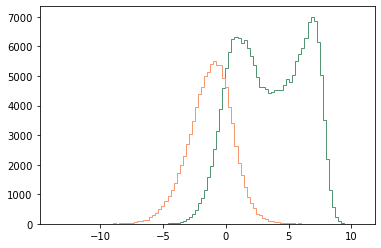

In [6]:
from scipy.special import logit

color_truth  = "#519872"
color_false  = "#F7996E"

lims = (logit(reco).min(), logit(reco).max())

plt.hist(logit(reco[truth == 1]), bins = 100, range = lims, color = color_truth, label = "Truth", histtype = "step")
plt.hist(logit(reco[truth == 0]), bins = 100, range = lims, color = color_false, label = "False", histtype = "step");


In [7]:
sample = truth[logit(reco) > 2]

In [8]:
vals, counts = np.unique(sample, return_counts = True)
counts / (len(sample))

array([0.01782297, 0.98217703])

In [9]:
counts[1] / np.sum(truth)

0.6461644310202648

In [10]:
with sqlite3.connect("/groups/hep/johannbs/data/rasmus_classification_muon_3neutrino_3mio.db") as conn:
    df = pd.read_sql(f"select * from truth where event_no in {tuple(dict['id'])}", conn)

In [11]:
dict

{'id': array([138674341, 138674355, 138674364, ..., 140547628, 140547635,
        140547638]),
 'reco': array([[0.7896045 ],
        [0.99950564],
        [0.9013684 ],
        ...,
        [0.94076777],
        [0.36142942],
        [0.9858131 ]], dtype=float32),
 'targets': array([[1.],
        [1.],
        [0.],
        ...,
        [0.],
        [1.],
        [1.]], dtype=float32),
 'Ns': array([56, 63, 58, ..., 21, 68, 59], dtype=int32),
 'metrics': {'binary_accuracy': 0.8446905016899109,
  'AUC': 0.9265165734269798,
  'TestLoss': 0.31609446}}

In [12]:
df.sort_values("event_no")
df['logit_stopped'] = logit(reco)[np.argsort(dict['id'])]
df['ns']            = np.log10(dict['Ns'])[np.argsort(dict['id'])]

In [13]:
splits = df.ns.quantile(np.linspace(0, 1, 5)[1:-1])
mask   = np.searchsorted(splits, df.ns)

In [14]:
splits

0.25    1.672098
0.50    1.770852
0.75    1.880814
Name: ns, dtype: float64

In [15]:
np.unique(mask, return_counts = True)

(array([0, 1, 2, 3]), array([77123, 76963, 73011, 72903]))

In [16]:
df.stopped_muon[mask == 3].sum()

28249

In [17]:
from sklearn.metrics import roc_curve, roc_auc_score

No handles with labels found to put in legend.


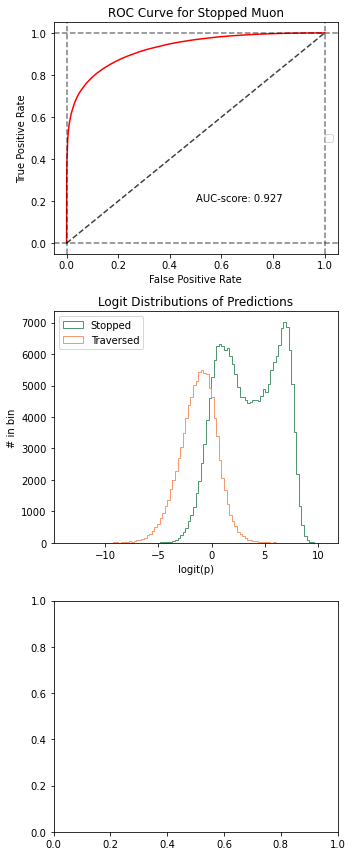

In [53]:
fig, axes = plt.subplots(nrows = 3, figsize = (5, 12))

scores = {}

ax = axes[0]

x, y, _ = roc_curve(df.stopped_muon, df.logit_stopped)
score = roc_auc_score(df.stopped_muon, df.logit_stopped)

ax.plot(x, y, 'r')
ax.plot(np.linspace(0, 1, 10), np.linspace(0, 1, 10), "k--", alpha = 0.75)
ax.axhline(0, 0, 1, color = "k", ls = "--", alpha = 0.5)
ax.axhline(1, 0, 1, color = "k", ls = "--", alpha = 0.5)
ax.axvline(0, 0, 1, color = "k", ls = "--", alpha = 0.5)
ax.axvline(1, 0, 1, color = "k", ls = "--", alpha = 0.5)


ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_title("ROC Curve for Stopped Muon")

ax.text(0.5, 0.2, f"AUC-score: {score:.3f}")

ax.legend()


ax = axes[1]

color_truth  = "#519872"
color_false  = "#F7996E"

lims = (logit(reco).min(), logit(reco).max())

ax.hist(logit(reco[truth == 1]), bins = 100, range = lims, color = color_truth, label = "Stopped", histtype = "step")
ax.hist(logit(reco[truth == 0]), bins = 100, range = lims, color = color_false, label = "Traversed", histtype = "step");

ax.set(xlabel = "logit(p)", ylabel = "# in bin", title = "Logit Distributions of Predictions")
# ax.set(ylabel = "# in bin")

ax.legend(loc = "upper left")



ax = axes[2]
# ax.hist2d()

fig.tight_layout()


In [54]:
mask == 0

array([False, False, False, ..., False, False, False])

In [55]:
_.sum()

-20541.258

In [56]:
mask == 1 

array([ True, False, False, ..., False,  True, False])

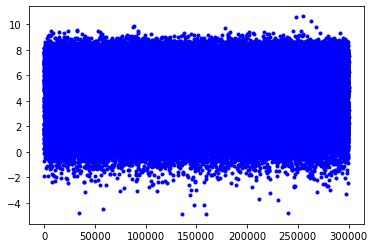

In [57]:
plt.plot(df.logit_stopped.loc[mask == 0].sort_values(), 'b.')

0         True
1         True
2         True
3         True
4         True
          ... 
299995    True
299996    True
299997    True
299998    True
299999    True
Name: event_no, Length: 300000, dtype: bool

In [58]:
df.corr()

,event_no,energy_log10,time,position_x,position_y,position_z,direction_x,direction_y,direction_z,azimuth,zenith,pid,muon_track_length,stopped_muon,logit_stopped,ns
event_no,1.000000,-0.001614,-0.000748,-0.001775,0.002436,0.002626,0.001912,-0.003026,-0.000667,-0.001401,-0.001618,NaN,-0.001403,0.000105,0.000322,-0.000047
energy_log10,-0.001614,1.000000,-0.120308,-0.009830,-0.002596,0.060493,0.009044,0.000858,-0.067496,-0.001477,-0.068416,NaN,0.886319,-0.700221,-0.644111,0.584873
time,-0.000748,-0.120308,1.000000,0.006341,0.018291,-0.323967,-0.006950,-0.011748,0.260294,-0.015098,0.240494,NaN,-0.158404,0.087198,0.033051,0.031708
position_x,-0.001775,-0.009830,0.006341,1.000000,0.015436,-0.012926,-0.850697,0.010333,0.008186,0.027248,0.007892,NaN,-0.008974,0.009154,0.010910,0.018029
position_y,0.002436,-0.002596,0.018291,0.015436,1.000000,-0.010074,0.008515,-0.862233,-0.001297,-0.618654,-0.002062,NaN,-0.010128,0.004526,0.007844,-0.030712
position_z,0.002626,0.060493,-0.323967,-0.012926,-0.010074,1.000000,0.012644,0.000360,-0.716517,0.003076,-0.710545,NaN,0.141681,-0.076372,0.081154,0.048121
direction_x,0.001912,0.009044,-0.006950,-0.850697,0.008515,0.012644,1.000000,-0.019617,-0.008910,-0.034777,-0.008641,NaN,0.007513,-0.006363,0.004318,-0.004742
direction_y,-0.003026,0.000858,-0.011748,0.010333,-0.862233,0.000360,-0.019617,1.000000,0.008668,0.724758,0.009295,NaN,0.007039,-0.002693,-0.000879,0.020876
direction_z,-0.000667,-0.067496,0.260294,0.008186,-0.001297,-0.716517,-0.008910,0.008668,1.000000,0.007660,0.980064,NaN,-0.032008,0.060870,-0.029714,0.043858
azimuth,-0.001401,-0.001477,-0.015098,0.027248,-0.618654,0.003076,-0.034777,0.724758,0.007660,1.000000,0.009287,NaN,0.003982,-0.001023,0.004112,0.008031


In [59]:
transformers = pd.read_pickle("/groups/hep/johannbs/data/transformers2.pkl")


In [60]:
df_sampled = df.sample(10000)

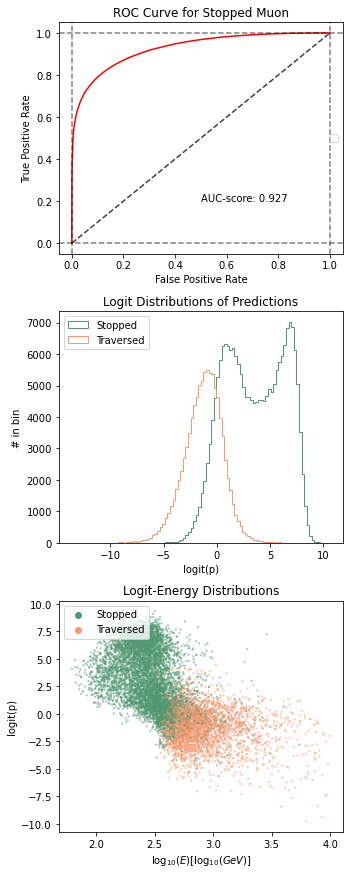

In [61]:
ax = axes[2]
color_creater = lambda x: color_truth if x else color_false
ax.scatter(transformers['truth']['energy_log10'].inverse_transform(np.array(df_sampled.energy_log10).reshape(1, -1)).flatten(), 
df_sampled.logit_stopped, s = 2, alpha = 0.35, color = df_sampled.stopped_muon.apply(color_creater));
# ax.scatter(df[df.stopped_muon == 0].energy_log10, df[df.stopped_muon == 0].logit_stopped, s = 1, alpha = 0.2, color = color_false)
ax.scatter([], [], color = color_truth, label = "Stopped")
ax.scatter([], [], color = color_false, label = "Traversed")

ax.set(xlabel = "$\log_{10}(E) [\log_{10}(GeV)]$", ylabel = "logit(p)", title = "Logit-Energy Distributions")
ax.legend(loc = "upper left")
fig

In [62]:
x, y, _ = roc_curve(df.stopped_muon, df.energy_log10)

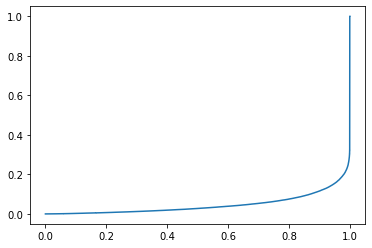

In [63]:
plt.plot(x, y)

In [64]:
1 - roc_auc_score(df.stopped_muon, df.energy_log10)


0.9545196784142332

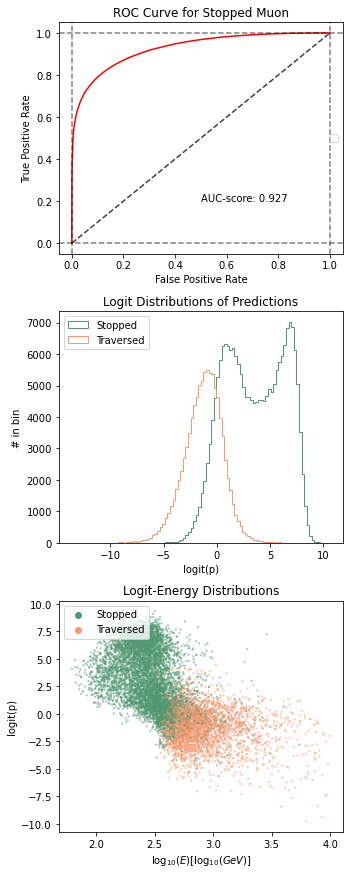

In [65]:
fig

In [50]:
fig.savefig("../figures/StoppedMuon.pdf", bbox_inches='tight')

In [51]:
x[1].shape

()

In [52]:
pd.DataFrame(x[0])

ValueError: DataFrame constructor not properly called!

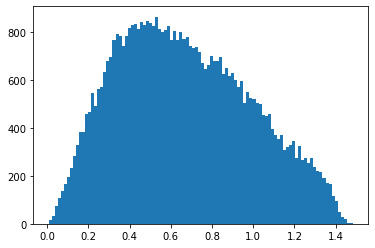

In [33]:
x, y = pd.read_pickle(os.path.join("..", "data", "features", "MuonsTest", "train50000.dat"))
plt.hist(y[:, 2], bins = 100);

In [37]:
y[:, 1:]

array([[4.434384  , 0.40617896],
       [1.39347674, 0.64952375],
       [0.93319101, 0.35560721],
       ...,
       [5.96767565, 1.02769969],
       [3.05269532, 1.13985414],
       [3.38052106, 1.05212987]])

In [36]:
import matplotlib.pyplot as plt 

np.concatenate(x)

array([[-0.80177513,  0.32778989,  0.36618868,  0.04853649,  1.03245861],
       [-0.80177513,  0.32778989,  0.33195904,  0.03668025,  0.50835111],
       [-0.80177513,  0.32778989,  0.29772942,  0.09373842,  0.23806267],
       ...,
       [-0.62053174,  0.81627012,  0.09174827, -0.22341608,  0.37896459],
       [-0.62053174,  0.81627012,  0.12597791, -0.27343461,  0.50835111],
       [-0.62053174,  0.81627012,  0.12597791, -0.30307521,  0.50835111]])

In [4]:
y

array([[7.13101600e+06, 1.51179985e+00, 1.17941677e+00],
       [7.13110100e+06, 5.37759901e+00, 1.84913419e+00],
       [7.13127100e+06, 6.17094016e+00, 2.17087827e+00],
       ...,
       [1.17104750e+08, 4.38546582e+00, 9.22474453e-01],
       [1.17104752e+08, 1.58638274e+00, 9.57550670e-01],
       [1.17104758e+08, 4.63404827e+00, 8.88264142e-01]])

In [20]:
xs = np.concatenate(x)
plt.hist(xs[:100000, :].T)


KeyboardInterrupt: 

In [ ]:
plt.hist(np.concatenate(x)[:10000, 4])

In [ ]:
from scripts.he

In [13]:
from helper_functions import angles_to_units

In [14]:
import tensorflow as tf

In [18]:
tf.math.reduce_euclidean_norm(angles_to_units(tf.cast(y, tf.float32)[:, 1:]), axis = 1

<tf.Tensor: shape=(50000, 3), dtype=float32, numpy=
array([[ 0.05450379,  0.92277545,  0.38146403],
       [ 0.59346974, -0.7565063 , -0.27475786],
       [ 0.8200959 , -0.09244053, -0.56471   ],
       ...,
       [-0.25597286, -0.75487983,  0.60384965],
       [-0.01274581,  0.817685  ,  0.57552475],
       [-0.06072835, -0.773598  ,  0.63075995]], dtype=float32)>

In [1]:
import matplotlib.pyplot as plt

In [ ]:
import sqlite3 2"

In [ ]:
path = "/groups/hep/pcs557/databases/dev_lvl7_mu_nu_e_classification_v003/data/dev_lvl7_mu_nu_e_classification_v003_unscaled.db"
with sqlite3.connect(path) as conn:
